In [1]:
import tensorflow as tf
import keras as K

Progressive Growing & Smoothing in of Higher Resolution Layers

In [2]:
def upscale_layer(layer, upscale_factor):
	'''
	Upscales layer (tensor) by the factor (int) where
      the tensor is [group, height, width, channels]
	'''
	height, width = layer.get_shape()[1:3]
	size = (upscale_factor * height, upscale_factor * width)
	upscaled_layer = tf.image.resize_nearest_neighbor(layer, size)
	return upscaled_layer

def smoothly_merge_last_layer(list_of_layers, alpha):
	'''
	Smoothly merges in a layer based on a threshold value alpha.
	This function assumes: that all layers are already in RGB.
	This is the function for the Generator.
	:list_of_layers	:	items should be tensors ordered by size
	:alpha 			: 	float \in (0,1)
	'''
	# Hint!
  # If you are using pure Tensorflow rather than Keras, always remember scope
	last_fully_trained_layer = list_of_layers[-2]
	# now we have the originally trained layer
	last_layer_upscaled = upscale_layer(last_fully_trained_layer, 2)

	# this is the newly added layer not yet fully trained
	larger_native_layer = list_of_layers[-1]

	# This makes sure we can run the merging code
	assert larger_native_layer.get_shape() == last_layer_upscaled.get_shape()

	# This code block should take advantage of broadcasting
	new_layer = (1-alpha) * upscaled_layer + larger_native_layer * alpha

	return new_layer

 Minibatch standard deviation

In [3]:
def minibatch_std_layer(layer, group_size=4):
  '''
  Will calculate minibatch standard deviation for a layer.
  Will do so under a pre-specified tf-scope with Keras.
  Assumes layer is a float32 data type. Else needs validation/casting.
  NOTE: there is a more efficient way to do this in Keras, but just for
  clarity and alignment with major implementations (for understanding)
  this was done more explicitly. Try this as an exercise.
  '''
  # Hint!
  # If you are using pure Tensorflow rather than Keras, always remember scope
  # minibatch group must be divisible by (or <=) group_size
  group_size = K.backend.minimum(group_size, tf.shape(layer)[0])

  # just getting some shape information so that we can use
  # them as shorthand as well as to ensure defaults
  shape = list(K.int_shape(input))
  shape[0] = tf.shape(input)[0]

  # Reshaping so that we operate on the level of the minibatch
  # in this code we assume the layer to be:
  # [Group (G), Minibatch (M), Width (W), Height (H) , Channel (C)]
  # but be careful different implementations use the Theano specific
  # order instead
  minibatch = K.backend.reshape(layer, (group_size, -1, shape[1], shape[2], shape[3]))

  # Center the mean over the group [M, W, H, C]
  minibatch -= tf.reduce_mean(minibatch, axis=0, keepdims=True)
  # Calculate the variance of the group [M, W, H, C]
  minibatch = tf.reduce_mean(K.backend.square(minibatch), axis = 0)
  # Calculate the standard deviation over the group [M,W,H,C]
  minibatch = K.backend.square(minibatch + 1e8)
  # Take average over feature maps and pixels [M,1,1,1]
  minibatch = tf.reduce_mean(minibatch, axis=[1,2,4], keepdims=True)
  # Add as a layer for each group and pixels
  minibatch = K.backend.tile(minibatch, [group_size, 1, shape[2], shape[3]])
  # Append as a new feature map
  return K.backend.concatenate([layer, minibatch], axis=1)

Equalized Learning Rate

In [4]:
def equalize_learning_rate(shape, gain, fan_in=None):
    '''
    This adjusts the weights of every layer by the constant from
    He's initializer so that we adjust for the variance in the dynamic range
    in different features
    shape   :   shape of tensor (layer): these are the dimensions of each layer.
    For example, [4,4,48,3]. In this case,
        [kernel_size, kernel_size, number_of_filters, feature_maps].
        But this will depend slightly on your implementation.
    gain    :   typically sqrt(2)
    fan_in  :   adjustment for the number of incoming connections as per Xavier's / He's initialization
    '''
    # Default value is product of all the shape dimension minus the feature maps dim -- this gives us the number of incoming connections per neuron
    if fan_in is None: fan_in = np.prod(shape[:-1])
    # This uses He's initialization constant (He et al, 2015)
    std = gain / K.sqrt(fan_in)
    # creates a constant out of the adjustment
    wscale = K.constant(std, name='wscale', dtype=np.float32)
    # gets values for weights and then uses broadcasting to apply the adjustment
    adjusted_weights = K.get_value('layer', shape=shape,
            initializer=tf.initializers.random_normal()) * wscale
    return adjusted_weights

Pixel-wise Feature Normalization

In [5]:
def pixelwise_feat_norm(inputs, **kwargs):
	'''
	Uses pixelwise feature normalization as proposed by
	Krizhevsky et at. 2012. Returns the input normalized
	:inputs 	: 	Keras / TF Layers
	'''
	normalization_constant = K.backend.sqrt(K.backend.mean(
					inputs**2, axis=-1, keepdims=True) + 1.0e-8)
	return inputs / normalization_constant

Running our own PGGAN

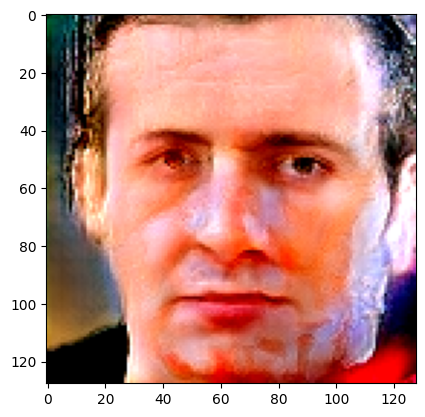

In [6]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

# Disable eager execution for TensorFlow 2.x to use tf.Graph
tf.compat.v1.disable_eager_execution()

# Define the graph context
with tf.Graph().as_default():
    # Load the Progressive GAN module from TensorFlow Hub
    module = hub.load("https://tfhub.dev/google/progan-128/1")
    latent_dim = 512

    # Generate a random latent vector
    latent_vector = tf.random.normal([1, latent_dim], seed=1337)

    # Access the generator function from the module signatures
    generator_fn = module.signatures['default']

    # Generate the image by passing the latent vector to the generator
    interpolated_images = generator_fn(latent_vector)

    # Run the session to get the generated image
    with tf.compat.v1.Session() as session:
        session.run(tf.compat.v1.global_variables_initializer())
        image_out = session.run(interpolated_images['default'])

# Plot the generated image
plt.imshow(image_out.reshape(128, 128, 3))
plt.show()


Extending on the PGGAN

TF-Hub generative image model

In [7]:
# Install the latest Tensorflow version.
!pip install --quiet "tensorflow>=1.7"
# Install TF-Hub.
!pip install tensorflow-hub
# Install imageio for creating animations.
!pip install imageio

In [8]:
#@title Imports and function definitions

import imageio
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import time
from IPython import display
from skimage import transform
import logging

# We could retrieve this value from module.get_input_shapes() if we didn't know
# beforehand which module we will be using.
latent_dim = 512


# Interpolates between two vectors that are non-zero and don't both lie on a
# line going through origin. First normalizes v2 to have the same norm as v1.
# Then interpolates between the two vectors on the hypersphere.
def interpolate_hypersphere(v1, v2, num_steps):
  v1_norm = tf.norm(v1)
  v2_norm = tf.norm(v2)
  v2_normalized = v2 * (v1_norm / v2_norm)

  vectors = []
  for step in range(num_steps):
    interpolated = v1 + (v2_normalized - v1) * step / (num_steps - 1)
    interpolated_norm = tf.norm(interpolated)
    interpolated_normalized = interpolated * (v1_norm / interpolated_norm)
    vectors.append(interpolated_normalized)
  return tf.stack(vectors)


# Given a set of images, show an animation.
def animate(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images)
  with open('./animation.gif','rb') as f:
      display.display(display.Image(data=f.read(), height=300))


# Simple way to display an image.
def display_image(image):
  plt.figure()
  plt.axis("off")
  plt.imshow(image)


# Display multiple images in the same figure.
def display_images(images, captions=None):
  num_horizontally = 5
  f, axes = plt.subplots(
      len(images) // num_horizontally, num_horizontally, figsize=(20, 20))
  for i in range(len(images)):
    axes[i // num_horizontally, i % num_horizontally].axis("off")
    if captions is not None:
      axes[i // num_horizontally, i % num_horizontally].text(0, -3, captions[i])
    axes[i // num_horizontally, i % num_horizontally].imshow(images[i])
  f.tight_layout()

logging.basicConfig(level=logging.ERROR)

Latent space interpolation

Random vectors

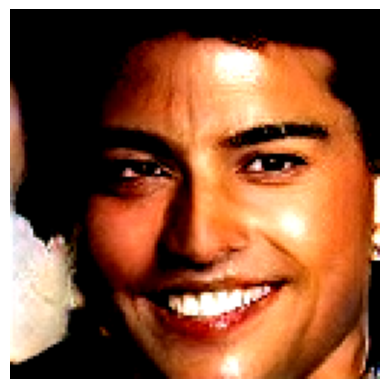

In [14]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Disable eager execution for TensorFlow 2.x to use tf.Graph
tf.compat.v1.disable_eager_execution()

latent_dim = 512  # Define the latent dimension

def interpolate_hypersphere(v1, v2, num_steps):
    """Interpolates between two vectors on the hypersphere."""
    vectors = []
    for alpha in np.linspace(0, 1, num_steps):
        v = tf.math.l2_normalize((1 - alpha) * v1 + alpha * v2)
        vectors.append(v)
    return tf.stack(vectors)

def animate(images):
    """Creates an animation of the generated images."""
    fig, ax = plt.subplots()

    # Display the first image
    im = ax.imshow(images[0].reshape(128, 128, 3))
    plt.axis('off')

    # Function to update the frame
    def update_frame(i):
        im.set_array(images[i].reshape(128, 128, 3))
        return [im]

    # Create the animation and assign it to a variable to prevent garbage collection
    anim = animation.FuncAnimation(
        fig, update_frame, frames=len(images), interval=200, blit=True
    )

    # Convert the animation to HTML video and return it
    return HTML(anim.to_jshtml())

def interpolate_between_vectors():
    with tf.Graph().as_default():
        # Load the Progressive GAN module from TensorFlow Hub
        module = hub.load("https://tfhub.dev/google/progan-128/1")

        # Change the seed to get different random vectors.
        v1 = tf.random.normal([latent_dim], seed=3)
        v2 = tf.random.normal([latent_dim], seed=1)

        # Create a tensor with 25 steps of interpolation between v1 and v2.
        vectors = interpolate_hypersphere(v1, v2, 25)

        # Access the generator function from the module signatures
        generator_fn = module.signatures['default']

        # Prepare inputs by reshaping the interpolated vectors to the required shape [batch_size, latent_dim]
        input_vectors = tf.reshape(vectors, [-1, latent_dim])

        # Use the generator function to create images
        interpolated_images = generator_fn(input_vectors)

        with tf.compat.v1.Session() as session:
            session.run(tf.compat.v1.global_variables_initializer())
            interpolated_images_out = session.run(interpolated_images['default'])

        # Animate the interpolated images
        return animate(interpolated_images_out)

# Call the function to interpolate between vectors and animate the results
interpolate_between_vectors()


Finding closest vector in latent space

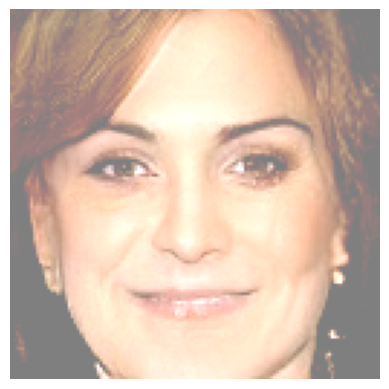

In [15]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import imageio
from skimage import transform
#from google.colab import files  # If you are using Google Colab, uncomment this
import matplotlib.pyplot as plt  # For displaying images

latent_dim = 512  # Set the latent dimension for ProGAN

image_from_module_space = True  # @param { isTemplate:true, type:"boolean" }

def get_module_space_image():
    """Generates an image from the ProGAN module space."""
    # Load the ProGAN module
    module = hub.load("https://tfhub.dev/google/progan-128/1")

    # Generate a random latent vector
    vector = tf.random.normal([1, latent_dim], seed=4)

    # Access the generator function using the 'default' signature
    # This is how you should call the loaded module for image generation
    generator_fn = module.signatures['default']

    # Generate images using the generator function
    images = generator_fn(vector)

    # Create a TensorFlow session to evaluate the tensor
    with tf.compat.v1.Session() as sess:
        # Initialize variables
        sess.run(tf.compat.v1.global_variables_initializer())
        # Evaluate the tensor and get the numpy array
        image_out = sess.run(images['default'])[0]

    # Scale the output to [0, 1] for displaying
    image_out = (image_out + 1) / 2
    return image_out

def upload_image():
    """Uploads an image from the user's computer."""
    uploaded = files.upload()  # If you are using Google Colab, keep this line
    image = imageio.imread(list(uploaded.keys())[0])  # Access the uploaded image correctly
    return transform.resize(image, [128, 128])

def display_image(image):
    """Displays an image using matplotlib."""
    plt.imshow(image)
    plt.axis('off')  # Turn off axis
    plt.show()

if image_from_module_space:
    target_image = get_module_space_image()
else:
    target_image = upload_image()

display_image(target_image)

In [19]:
def find_closest_latent_vector(num_optimization_steps):
    images = []
    losses = []
    with tf.Graph().as_default():
        module = hub.load("https://tfhub.dev/google/progan-128/1")

        initial_vector = tf.random.normal([1, latent_dim], seed=5)

        # Use tf.compat.v1.get_variable for TensorFlow 1.x compatibility
        with tf.compat.v1.variable_scope("latent_vector_scope"):
            vector = tf.compat.v1.get_variable("vector", initializer=initial_vector)

        image = module(vector)

        target_image_difference = tf.reduce_sum(
            tf.losses.absolute_difference(image[0], target_image[:,:,:3]))

        # The latent vectors were sampled from a normal distribution. We can get
        # more realistic images if we regularize the length of the latent vector to
        # the average length of vector from this distribution.
        regularizer = tf.abs(tf.norm(vector) - np.sqrt(latent_dim))

        loss = target_image_difference + regularizer

        optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=0.3)
        train = optimizer.minimize(loss)

        with tf.compat.v1.Session() as session:
            session.run(tf.compat.v1.global_variables_initializer())
            for _ in range(num_optimization_steps):
                _, loss_out, im_out = session.run([train, loss, image])
                images.append(im_out[0])
                losses.append(loss_out)
                print(loss_out)
    return images, losses

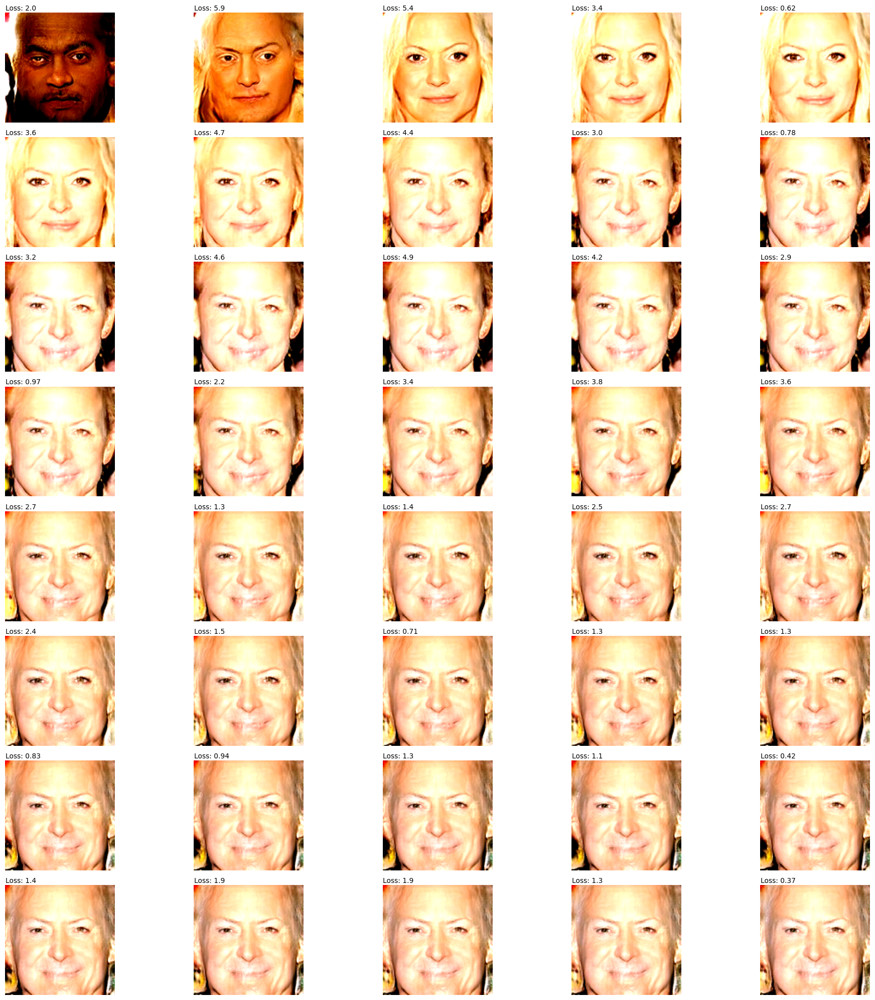

In [20]:
captions = [ f'Loss: {l:.2}' for l in result[1]]
display_images(result[0], captions)